In [2]:
import wandb
import sys
import matplotlib.pyplot as plt
import scprep
import pandas as pd
sys.path.append('../src/')
from evaluate import get_results
from omegaconf import OmegaConf
from main import load_data
from model import AEDist
import numpy as np
import os
import glob
import torch
import pickle
from tqdm import tqdm

In [3]:
import wandb
import sys
import matplotlib.pyplot as plt
import scprep
import pandas as pd
sys.path.append('../src/')
from diffusion import DiffusionModel
from evaluate import get_results
from omegaconf import OmegaConf
from main import load_data, make_model
import numpy as np
import os
import glob
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter
import torch
from model import AEDist
import magic
import torch
import numpy as np
import matplotlib.pylab as pl
import ot
import ot.plot

In [4]:
def generate_samples_steps(model, num_samples):
    model.eval()  # Ensure the model is in evaluation mode

    # Initial random noise
    x_t = torch.randn(num_samples, model.hparams.data_size, device=model.device)

    # Utilize the buffers for betas, alphas, and alphas_cumprod (already on the correct device)
    betas = model.betas
    alphas = model.alphas
    alphas_cumprod = model.alphas_cumprod

    # Generate t values for reverse process, normalized
    t_values = torch.arange(0, model.hparams.num_steps, device=model.device).flip(0)

    xts = [x_t]
    with torch.no_grad():
        for t in tqdm(t_values):
            # Calculate the current alpha and noise for this step
            sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod[t])
            sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - alphas_cumprod[t])
            t_norm = t.float() / (model.hparams.num_steps - 1)
            t_batch = t_norm.repeat(num_samples, 1)

            # Model prediction to refine the current state
            epsilon_t = model(x_t, t_batch)
            mu_t = (x_t - (1 - alphas[t]) / sqrt_one_minus_alphas_cumprod * epsilon_t) / torch.sqrt(alphas[t])
            noise1 = torch.randn(num_samples, model.hparams.data_size, device=model.device)
            x_t = mu_t + torch.sqrt(betas[t]) * noise1
            xts.append(x_t)

    return xts, t_values

In [5]:
wandb.login()
api = wandb.Api()

entity = "xingzhis"
project = "dmae"
sweep_id = 'xnofq5zn'

sweep = api.sweep(f"{entity}/{project}/{sweep_id}")

# Initialize an empty list to store run data
runs_data = []

# Iterate through each run in the sweep
for run in sweep.runs:
    # Extract metrics and configs
    metrics = run.summary._json_dict
    configs = run.config
    
    # Combine metrics and configs, and add run ID
    combined_data = {**metrics, **configs, "run_id": run.id}
    
    # Append the combined data to the list
    runs_data.append(combined_data)

# Create a DataFrame from the runs data
df = pd.DataFrame(runs_data)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: xingzhis. Use `wandb login --relogin` to force relogin


In [6]:
run_id = df[(df['num_steps'] == 10000) & (df['data'] == 'eb_all_new_2.npz')].sort_values('train_loss_epoch', ascending=True)['run_id'].iloc[0]

In [7]:
run = api.run(f"{entity}/{project}/{run_id}")

In [8]:
folder_path = '../src/wandb/'
cfg = OmegaConf.create(run.config)
folder_list = glob.glob(f"{folder_path}*{run.id}*")
ckpt_files = glob.glob(f"{folder_list[0]}/files/*.ckpt")
ckpt_path = ckpt_files[0]
diffusionmodel = DiffusionModel.load_from_checkpoint(
    checkpoint_path=ckpt_path,
)
data_path = cfg.path + cfg.data
data_latent = np.load(data_path)
train_mask = data_latent['train_mask'].astype(bool)
with torch.no_grad():
    genxs, ts = generate_samples_steps(diffusionmodel, (~train_mask).sum())


/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:269: UserWarning: Attribute 'activation_fn' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['activation_fn'])`.
  rank_zero_warn(
100%|██████████| 10000/10000 [01:36<00:00, 103.48it/s]


In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def animate_scatter(a, b, c, fps=10, pause_duration=2):
    """
    Creates a scatter plot of numpy array `b` and overlays an animation of each numpy array in list `a`.
    
    Parameters:
    - a: List of numpy arrays (n by 2), to be animated.
    - b: Numpy array (n by 2), to be plotted as static background scatter plot.
    - fps: Frames per second for the animation.
    """
    total_frames = len(a) + pause_duration * fps  # Adding extra frames for the pause

    # Set up the figure and axis for the plot
    fig, ax = plt.subplots()
    
    # Plot `b` as a static scatter plot in gray, with alpha 0.5
    ax.scatter(b[:, 0], b[:, 1], color='gray', alpha=0.5)
    
    # Plot an initial scatter plot for the first element of `a` to set up the animation
    scatter = ax.scatter(a[0][:, 0], a[0][:, 1], color='blue', alpha=0.5)
    title = ax.set_title(f'step: {c[0]}')

    # Animation update function
    def update(frame):
        # Update the data of the scatter plot for the current frame
        if frame < len(a):
            scatter.set_offsets(a[frame])
            ax.set_title(f'step {c[frame]}')
        return scatter,
    
    # Create the animation
    anim = FuncAnimation(fig, update, frames=total_frames, interval=1000/fps, blit=True, repeat=False)
    
    # plt.show()
    return anim

# Example usage:
# Assuming `a` is your list of np arrays and `b` is your np array
# a = [np.random.rand(10, 2) for _ in range(20)]  # Example data
# b = np.random.rand(10, 2)  # Example data
# animate_scatter(a, b, fps=10)


In [10]:
data_latent_train = data_latent['data'][train_mask]
mean_, std_ = np.mean(data_latent_train, axis=0), np.std(data_latent_train, axis=0)
for i in range(len(genxs)):
    genxs[i] = genxs[i] * std_ + mean_

In [11]:
import numpy as np

# Number of elements and selections
total_elements = len(genxs) - 1
selections = 100

# Generate linearly spaced values, starting slightly above 0 to avoid log(0)
linear_space = np.linspace(1e-5, 1, selections)

# Apply a logarithmic transformation
# The constant can be adjusted to control the distribution density
non_linear_space = np.log(200 * linear_space + 1)

# Scale the non-linear values to fit the range of indices
scaled_indices = np.round((non_linear_space - non_linear_space.min()) / (non_linear_space.max() - non_linear_space.min()) * (total_elements - 1)).astype(int)

# Ensure uniqueness and sort
unique_indices = np.unique(scaled_indices)


# If you end up with fewer elements due to rounding, you might need to adjust by selecting more initially or by adding missing indices here.

print(unique_indices)
print(len(unique_indices))


[   0 2082 3048 3683 4158 4537 4852 5122 5358 5568 5757 5928 6086 6231
 6366 6492 6610 6721 6825 6925 7019 7109 7195 7277 7355 7431 7503 7573
 7641 7706 7769 7829 7888 7946 8001 8055 8107 8158 8208 8256 8304 8350
 8394 8438 8481 8523 8564 8604 8644 8682 8720 8757 8793 8829 8864 8898
 8932 8965 8997 9029 9061 9091 9122 9152 9181 9210 9239 9267 9295 9322
 9349 9376 9402 9428 9453 9478 9503 9528 9552 9576 9599 9623 9646 9668
 9691 9713 9735 9757 9778 9799 9820 9841 9861 9882 9902 9922 9941 9961
 9980 9999]
100


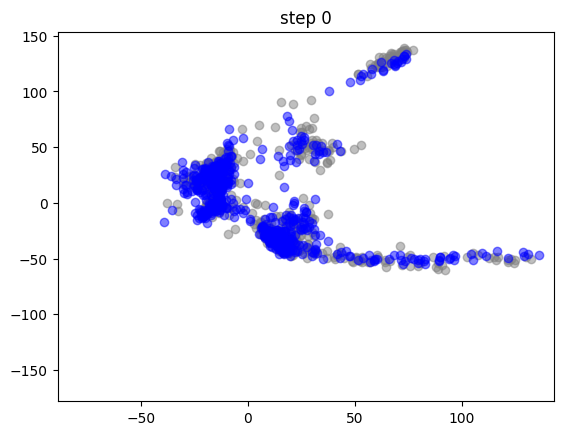

In [12]:
# a = [genxs[i].cpu().numpy() for i in range(0, len(genxs), 100)]

a = [genxs[i] for i in unique_indices]
b = data_latent['data'][~train_mask]
c = ts[unique_indices].cpu().numpy()
anim = animate_scatter(a, b, c, fps=10)
from IPython.display import HTML
HTML(anim.to_jshtml())

In [13]:
anim.save('eb_dm.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [14]:
ae_run_id = 'guesg5ug'

In [19]:
generated_latent = genxs[-1]

In [21]:
latent_test = data_latent['data'][~train_mask]

In [24]:
ids_df = pd.read_csv('../dm_data/differnt_dims.csv')

In [25]:
ids_df

,data.name,emb_dim,validation/reconstr_loss,validation/dist_accuracy,run_id
0,eb_subset_all,5,1.428262,0.866203,9xtkqnkl
1,eb_subset_all,15,1.315820,0.867569,u98snjwi
2,eb_subset_all,20,1.294534,0.879244,9sapq4h8
3,eb_subset_all,25,1.277464,0.875017,m07wclny
4,eb_subset_all,30,1.278060,0.880826,p14vurq1
5,sea_ad_gaba_all,5,0.657298,0.918041,najohsy0
6,sea_ad_gaba_all,15,0.638394,0.927088,m2874yfn
7,sea_ad_gaba_all,20,0.639052,0.937962,4se1cs5d
8,sea_ad_gaba_all,25,0.626545,0.937596,islnpqz2
9,sea_ad_gaba_all,30,0.647009,0.932049,cbgj4rf2


In [63]:
pca_path = f"../data/eb_subset_all_pcs.npz"
n_top_genes=10000

In [74]:
def compute_w2(gen, tru, device=torch.device("cuda" if torch.cuda.is_available() else "cpu")):
    M = ot.dist(gen, tru)
    M = torch.tensor(M, dtype=torch.float32, device=device)
    # M/=M.max()
    assert gen.shape[0] == tru.shape[0]
    n = gen.shape[0]
    a, b = torch.ones((n,)).to(device) / n, torch.ones((n,)).to(device) / n  # uniform distribution on samples
    G0 = ot.emd(a, b, M)
    W = torch.sum(G0 * M)
    return torch.sqrt(W)

latent_gen = genxs[-1].cpu().numpy()
latent_test = data_latent['data'][~train_mask]
latent_train = data_latent['data'][train_mask]

std = latent_train.std()
noises = np.arange(1, 10) * 0.1
w2s = []
for noise in noises:
    noisy_test = latent_test + np.random.randn(*latent_test.shape) * noise * std
    w2 = compute_w2(noisy_test, latent_test).detach().cpu().numpy()
    w2s.append(w2)

mean = latent_train.mean(axis=0)
cov = np.cov(latent_train, rowvar=False)
rand_samples = np.random.multivariate_normal(mean, cov, latent_test.shape[0])

res = np.array([noises, w2s]).T
w_rand = compute_w2(rand_samples, latent_test).cpu().numpy()
w_gen = compute_w2(latent_gen, latent_test).cpu().numpy()

np.random.seed(423)
latent_train_subset_id = np.random.choice(np.arange(len(latent_train)), size=len(latent_test), replace=False)
latent_train_subset = latent_train[latent_train_subset_id]
w_train = compute_w2(latent_train_subset, latent_test).cpu().numpy()

res_dict = dict(
    w_increasing_noise=res,
    w_noise=w_rand,
    w_gen=w_gen,
    w_train=w_train,
)

In [75]:
# res_dict = {}
run = api.run(f"{entity}/{project}/{ae_run_id}")
cfg = OmegaConf.create(run.config)
folder_list = glob.glob(f"{folder_path}*{run.id}*")
ckpt_files = glob.glob(f"{folder_list[0]}/files/*.ckpt")
ckpt_path = ckpt_files[0]
data_path2 = os.path.join(cfg.data.root, cfg.data.name + cfg.data.filetype)
data = np.load(data_path2, allow_pickle=True)
"""
Had to load the checkpoint manually to check the new hyperparameter added in the new code.
"""
# model = AEDist.load_from_checkpoint(ckpt_path)
checkpoint = torch.load(ckpt_path, map_location=lambda storage, loc: storage)
if 'dist_std' not in checkpoint['hyper_parameters']:
    checkpoint['hyper_parameters']['dist_std'] = 1.0  # Add the missing hyperparameter with default value
    checkpoint['state_dict']['dist_std'] = torch.tensor([1.0])
model = AEDist(**checkpoint['hyper_parameters'])
model.load_state_dict(checkpoint['state_dict'])


model.eval()
with torch.no_grad():
    gen_decoded = model.decode(generated_latent)
with torch.no_grad():
    test_decoded = model.decode(torch.tensor(latent_test, dtype=torch.float32))
test_ambient = data['data'][~data['is_train'].astype(bool)]
test_ambient = torch.tensor(test_ambient, dtype=torch.float)
train_ambient = data['data'][data['is_train'].astype(bool)]
train_ambient = torch.tensor(train_ambient, dtype=torch.float)
magic_op = magic.MAGIC()
x_magic = magic_op.fit_transform(test_ambient.cpu().numpy())
pc_data = np.load(pca_path)
pca_loadings = pc_data['pca_loadings']
data_mean = pc_data['data_mean']
pca_data = x_magic
orig_magic = np.dot(pca_data, pca_loadings.T) + data_mean
orig_magic = np.asarray(orig_magic)
orig_magic = torch.tensor(orig_magic, dtype=torch.float32)
pca_data = gen_decoded.cpu().numpy()
orig_gen = np.dot(pca_data, pca_loadings.T) + data_mean
orig_gen = np.asarray(orig_gen)
orig_gen = torch.tensor(orig_gen, dtype=torch.float32)
pca_data = train_ambient.cpu().numpy()
orig_train = np.dot(pca_data, pca_loadings.T) + data_mean
orig_train = np.asarray(orig_train)
orig_train = torch.tensor(orig_train, dtype=torch.float32)
pca_data = test_decoded.cpu().numpy()
orig_dec = np.dot(pca_data, pca_loadings.T) + data_mean
orig_dec = np.asarray(orig_dec)
orig_dec = torch.tensor(orig_dec, dtype=torch.float32)
orig_vars = orig_magic.var(axis=0)
top_100_idx = torch.argsort(orig_vars).flip(0)[:n_top_genes]
magic_top100 = orig_magic[:,top_100_idx].cpu().numpy()
gen_top100 = orig_gen[:,top_100_idx].cpu().numpy()
dec_top100 = orig_dec[:,top_100_idx].cpu().numpy()
corrs_magic = np.corrcoef(magic_top100, rowvar=False)
corrs_gen = np.corrcoef(gen_top100, rowvar=False) 
corrs_dec = np.corrcoef(dec_top100, rowvar=False)
mse_gen = ((corrs_magic - corrs_gen)**2).mean()
mse_dec = ((corrs_magic - corrs_dec)**2).mean()
res_dict['corrs_magic'] = corrs_magic
res_dict['corrs_gen'] = corrs_gen
res_dict['corrs_dec'] = corrs_dec
res_dict['mse_gen'] = mse_gen
res_dict['mse_dec'] = mse_dec
res_dict['orig_magic'] = orig_magic
res_dict['orig_gen'] = orig_gen
res_dict['orig_dec'] = orig_dec
res_dict['orig_train'] = orig_train
res_dict['top_100_idx'] = top_100_idx.cpu().numpy()

Calculating MAGIC...
  Running MAGIC on 600 cells and 50 genes.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 0.04 seconds.
  Calculating imputation...
Calculated MAGIC in 0.05 seconds.


/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/dmae/notebooks/../src/model.py:315: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer('mean', torch.tensor(mean, dtype=torch.float32), persistent=True)
/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/dmae/notebooks/../src/model.py:316: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.register_buffer('std', torch.tensor(std, dtype=torch.float32), persistent=True)
/gpfs/gibbs/pi/krishnaswamy_smita/xingzhi/.conda_envs/geosink/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:269: UserWarning: Attribute 'activation_fn' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore t

In [76]:
res_dict.keys()

dict_keys(['w_increasing_noise', 'w_noise', 'w_gen', 'w_train', 'corrs_magic', 'corrs_gen', 'corrs_dec', 'mse_gen', 'mse_dec', 'orig_magic', 'orig_gen', 'orig_dec', 'orig_train', 'top_100_idx'])

In [77]:
res_dict['mse_dec']

0.02482747964494725

In [78]:
res_dict['mse_gen']

0.04378901339345212

In [79]:
res_dict1 = res_dict.copy()

In [80]:
res_dict1

{'w_increasing_noise': array([[ 0.1       ,  3.31394434],
        [ 0.2       ,  6.42365217],
        [ 0.3       ,  9.24539089],
        [ 0.4       , 13.26017475],
        [ 0.5       , 16.42116165],
        [ 0.6       , 20.71463776],
        [ 0.7       , 22.80266571],
        [ 0.8       , 27.59756279],
        [ 0.9       , 32.13501358]]),
 'w_noise': array(31.28771, dtype=float32),
 'w_gen': array(21.68817, dtype=float32),
 'w_train': array(15.242662, dtype=float32),
 'corrs_magic': array([[ 1.        , -0.36993172,  0.89056842, ..., -0.52350922,
          0.36734139,  0.38838128],
        [-0.36993172,  1.        , -0.26634753, ...,  0.41055363,
         -0.60916913, -0.07064825],
        [ 0.89056842, -0.26634753,  1.        , ..., -0.45664924,
          0.22622348,  0.10600315],
        ...,
        [-0.52350922,  0.41055363, -0.45664924, ...,  1.        ,
         -0.3526366 , -0.19442929],
        [ 0.36734139, -0.60916913,  0.22622348, ..., -0.3526366 ,
          1.       

In [89]:
results[0]

{'w_increasing_noise': array([[ 0.1       ,  6.01967812],
        [ 0.2       , 10.64333916],
        [ 0.3       , 15.58194637],
        [ 0.4       , 21.2957058 ],
        [ 0.5       , 27.33392715],
        [ 0.6       , 32.94140244],
        [ 0.7       , 37.27119827],
        [ 0.8       , 42.95901871],
        [ 0.9       , 49.7448082 ]]),
 'w_noise': array(36.658775, dtype=float32),
 'w_gen': array(20.809223, dtype=float32),
 'w_train': array(18.450493, dtype=float32),
 'latent_train_subset': array([[-15.771377 ,   3.6944597, -10.884064 ,   2.8746016, -14.314945 ],
        [ 18.106565 ,  23.083742 , -26.989264 , -30.578766 , -94.02018  ],
        [-20.069668 ,  -3.1323726,  -2.9810357,  13.437649 , -10.528727 ],
        ...,
        [ 11.506549 ,  30.989079 , -20.222052 , -25.976545 , -65.35638  ],
        [-18.673668 ,  -1.6330998,  -5.6763463,   4.7179294, -12.205729 ],
        [-15.548065 ,   3.3810394, -14.3977785,  -3.204422 , -16.634483 ]],
       dtype=float32),
 'latent_

In [93]:
res_dict1['data'] = results[0]['data']
res_dict1['emb_dim'] = 2

In [94]:
with open('dm_results_eval_tune_raw.pkl', 'rb') as file:
    results = pickle.load(file)

results_lists = []
for res in [res_dict1] + results:
    res_dict = dict(
        data=res['data'],
        emb_dim=res['emb_dim'],
        w_gen=res['w_gen'],
        w_noise=res['w_noise'],
        w_train=res['w_train'],
        mse_gen=res['mse_gen'],
        mse_dec=res['mse_dec'],
    )
    results_lists.append(res_dict)
results_df = pd.DataFrame(results_lists)

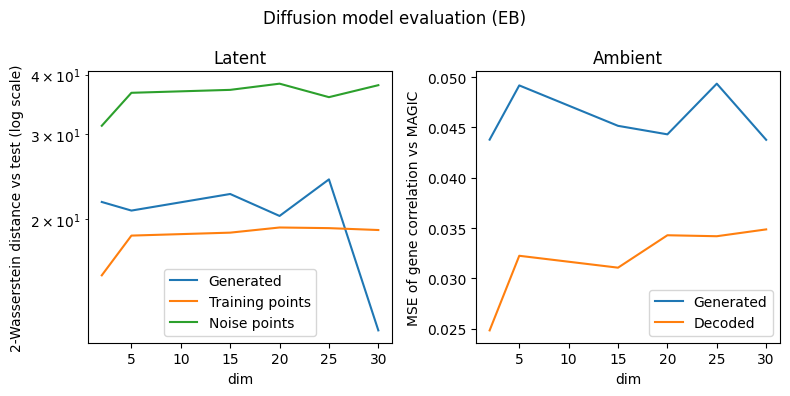

In [95]:
take_log = lambda data: np.log(np.array([arr.item() for arr in data]))
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
eb_res = results_df[results_df['data'] == 'eb_subset_all']
axes[0].plot(eb_res['emb_dim'], eb_res['w_gen'], label='Generated')
axes[0].plot(eb_res['emb_dim'], eb_res['w_train'], label='Training points')
axes[0].plot(eb_res['emb_dim'], eb_res['w_noise'], label='Noise points')
axes[0].set_xlabel('dim')
axes[0].set_ylabel('2-Wasserstein distance vs test (log scale)')
axes[0].legend()
axes[0].set_yscale('log')
axes[0].set_title('Latent')
axes[1].plot(eb_res['emb_dim'], eb_res['mse_gen'], label='Generated')
axes[1].plot(eb_res['emb_dim'], eb_res['mse_dec'], label='Decoded')
axes[1].set_xlabel('dim')
axes[1].set_ylabel('MSE of gene correlation vs MAGIC')
axes[1].legend()
axes[1].set_title('Ambient')
plt.suptitle('Diffusion model evaluation (EB)')
plt.tight_layout()
plt.show()

In [83]:
results_df

,data,emb_dim,w_gen,w_noise,w_train,mse_gen,mse_dec
0,eb_subset_all,5,20.809223,36.658775,18.450493,0.049180,0.032244
1,eb_subset_all,15,22.536175,37.180218,18.714165,0.045161,0.031062
2,eb_subset_all,20,20.279007,38.304073,19.18369,0.044316,0.034284
3,eb_subset_all,25,24.175356,35.897877,19.124859,0.049353,0.034187
4,eb_subset_all,30,11.697164,38.02656,18.95146,0.043771,0.034867
5,sea_ad_gaba_all,5,48.9995,105.17234,33.755486,0.020667,0.016524
6,sea_ad_gaba_all,15,56.590214,115.12244,35.70637,0.025618,0.017931
7,sea_ad_gaba_all,20,57.222553,111.548294,35.721085,0.024168,0.020316
8,sea_ad_gaba_all,25,57.980907,111.69954,35.605717,0.028985,0.021506
9,sea_ad_gaba_all,30,69.54936,111.07132,36.0708,0.024930,0.020752
